# Removing background noise from documents

This project is realted to the kaggle competition "Denoising Dirty Documents": https://www.kaggle.com/c/denoising-dirty-documents/overview
the objetive is to remove the background noise from images of documents such that we can use them in the Optical Character Recognition (OCR) which is the transforming the document into a digitized format.
The background noise can be because of a coffee stain, wrinkles, folding, faded suns pots, ...


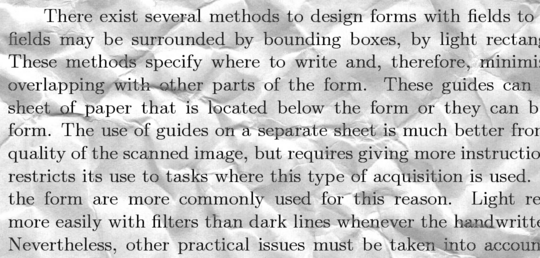!

To do this I decided to use a deep learning algorithm, namely an Autoencoder which is a type of convolutional neural network (CNN) architecture used for unsupervised learning tasks,e.g., dimensionality reduction and feature learning. The Autoencoder comprises two main components: an encoder and a decoder. The encoder takes an input and compresses it into a latent representation, typically of lower dimensionality than the input. This latent representation captures the most important features of the input data. The decoder then attempts to reconstruct the original input from the compressed representation. During training, the autoencoder aims to minimize the reconstruction error (in pur case the MSE). Below is a schematic structure of an autoencoder from Wikipedia:


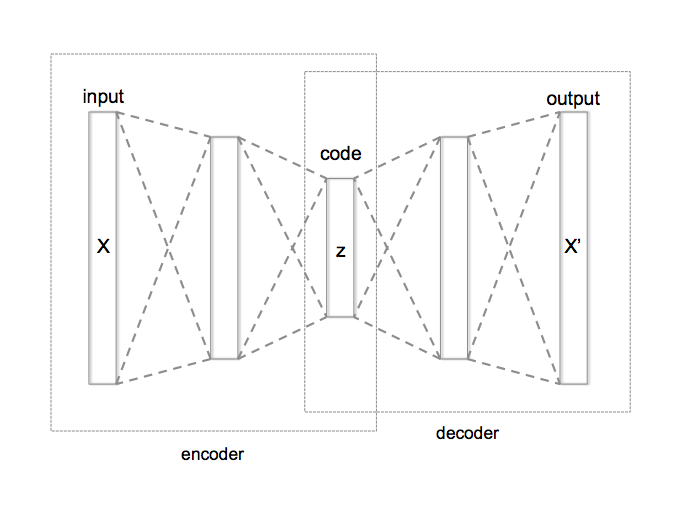

importing libraries:

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import json
import zipfile
from PIL import Image
import pytesseract
import tensorflow as tf
from tensorflow import keras 
from keras import Sequential
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dropout, BatchNormalization, Input, Conv2DTranspose
from tensorflow.keras.callbacks import EarlyStopping
from IPython.display import Image, display
from tensorflow.keras.optimizers import Adam

%matplotlib inline

----------
Data cleaning, image processing and EDA
-----------

Reading and extracting zipped files:

In [2]:
files = os.listdir('/kaggle/input/denoising-dirty-documents')

for file in files:
    print(file)
    with zipfile.ZipFile('/kaggle/input/denoising-dirty-documents/' + file, 'r') as zip_ref:
        zip_ref.extractall('/kaggle/working')

train.zip
sampleSubmission.csv.zip
train_cleaned.zip
test.zip


listing the directeries in "working" folder of Kaggle

In [3]:
os.listdir('/kaggle/working')

['.virtual_documents',
 'sampleSubmission.csv',
 'train',
 'test',
 'train_cleaned']

Creating a list of names of images in train and "cleaned_trained" folders (and sort them by name)

In [4]:
train = [os.path.join('train', image) for image in sorted(os.listdir('train'))]
train_cleaned = [os.path.join('train_cleaned', image) for image in sorted(os.listdir('train_cleaned'))]

showing some examples of image names in both lists

In [5]:
print(train[:5])
print(train_cleaned[:5])

['train/101.png', 'train/102.png', 'train/104.png', 'train/105.png', 'train/107.png']
['train_cleaned/101.png', 'train_cleaned/102.png', 'train_cleaned/104.png', 'train_cleaned/105.png', 'train_cleaned/107.png']


In [97]:
print('# of images in train: ', len(train))
print('# of images in train_cleaned: ', len(train_cleaned))

# of images in train:  144
# of images in train_cleaned:  144


There are 144 images in both train and train_cleaned folder. So, not so much!

Creating a list of names of images in test folders (to use it for the submission file this list should be sorted)

In [7]:
test = [os.path.join('test', image) for image in sorted(os.listdir('test'))]

some example of image names in test

In [8]:
print(test[:5])

['test/1.png', 'test/10.png', 'test/100.png', 'test/103.png', 'test/106.png']


In [9]:
print('# of images in train: ', len(test))

# of images in train:  72


there are 72 images in test folder

Showing some examples of training images: original (not cleaned) vs cleaned

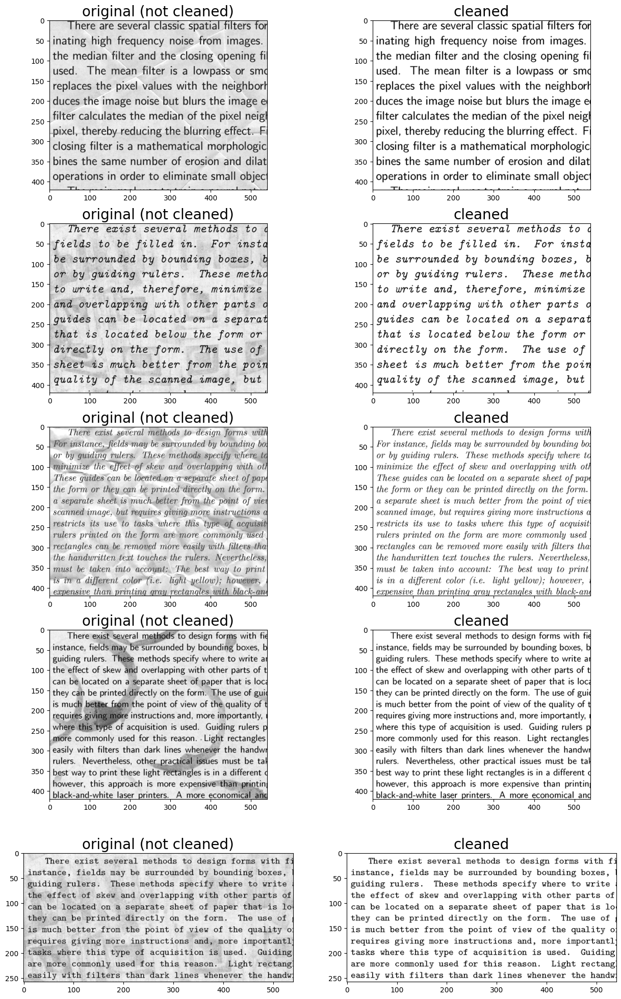

In [10]:
fig, ax = plt.subplots(5, 2, figsize=(15, 25))

for i,j in enumerate([10, 20, 40, 60, 120]):
    image = plt.imread(train[j])
    ax[i, 0].imshow(image, cmap='gray')
    ax[i,0].set_title('original (not cleaned)', fontsize=20)

    image = plt.imread(train_cleaned[j])
    ax[i, 1].imshow(image, cmap='gray')
    ax[i,1].set_title('cleaned', fontsize=20)
    
plt.show()

From the examples above it seems that the size of images are not always the same !
we will fix this later

a helper function to plot the "average hostogram" of the grayscale of images and compare the non-cleaned images and cleaned ones

In [11]:

def plot_histograms(folders, titles):
    fig, axes = plt.subplots(len(folders), 1, figsize=(10, 10))

    # Iterate through folders
    for i, folder in enumerate(folders):
        # Collect grayscale histograms
        histograms = []
        for image in folder:
            image = cv2.imread(image, cv2.IMREAD_GRAYSCALE)
            hist = cv2.calcHist([image], [0], None, [256], [0, 256])
            histograms.append(hist)

        # Calculate average histogram
        avg_hist = np.mean(histograms, axis=0)

        # Plot histogram
        axes[i].hist(np.arange(256), bins=100, weights=avg_hist, color='black')
        axes[i].set_title(titles[i])
        axes[i].set_xlabel('Pixel Value')
        axes[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

Compare histograms:

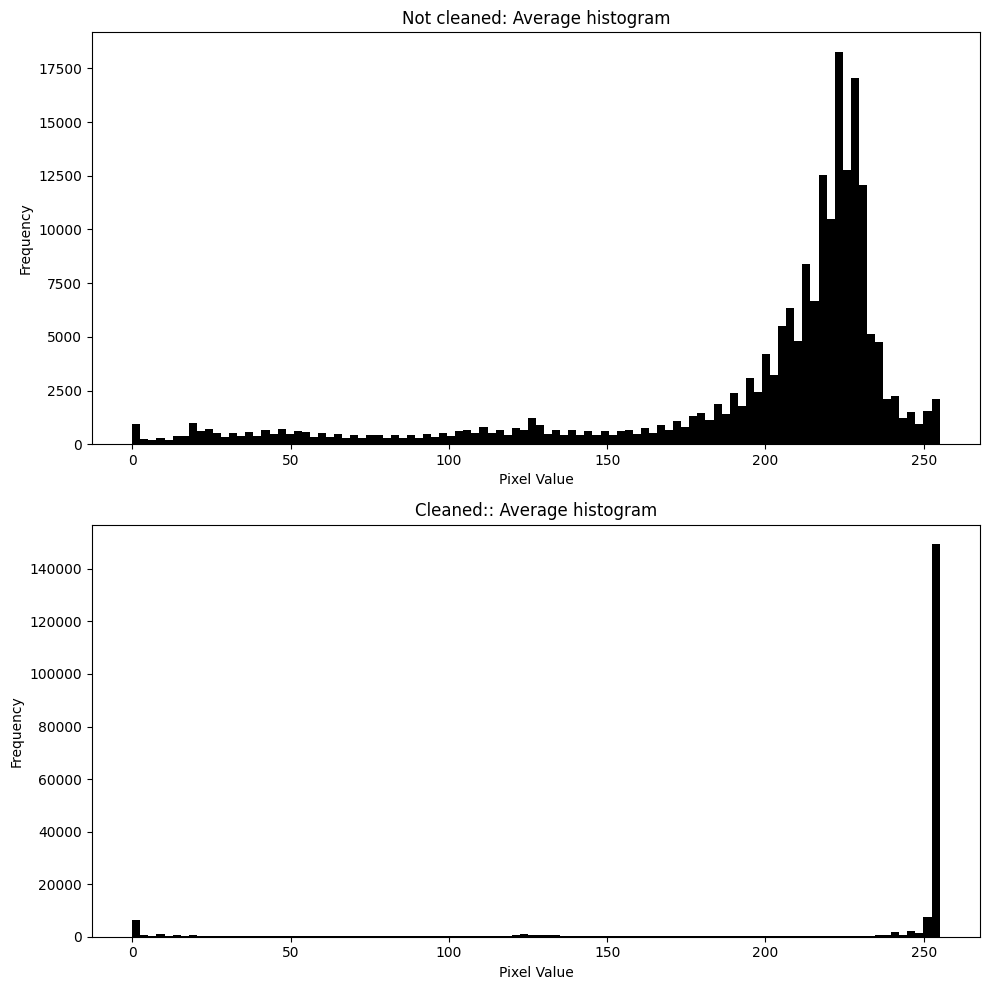

In [98]:
folders= [train, train_cleaned] 
titles = ['Not cleaned: Average histogram', 'Cleaned:: Average histogram']

# Plot histograms
plot_histograms(folders, titles)

From the histograms above, one can confirm that while for the cleaned images the gray scale is mostly on the extreme limits (black and whilte and infact mostly white), for the non-cleaned images the grayscale is spread more uniformly due to the presence of the background noise

A helper function to find the size of each image

In [13]:
def image_sizes(images):
    sizes = []
    for image in images:
        img = plt.imread(image)
        sizes.append(img.shape)
    return sizes

finding the unique sizes of images in each folder (using the function above)

In [14]:
train_sizes = np.array(image_sizes(train))
train_cleaned_sizes = np.array(image_sizes(train_cleaned))
test_sizes = np.array(image_sizes(test))

train_sizes_set = np.unique(train_sizes,return_counts=True, axis=0)
train_cleaned_sizes_set = np.unique(train_cleaned_sizes,return_counts=True, axis=0)
test_sizes_set = np.unique(test_sizes,return_counts=True, axis=0)
print(train_sizes_set)
print(train_cleaned_sizes_set)
print(test_sizes_set)

(array([[258, 540],
       [420, 540]]), array([48, 96]))
(array([[258, 540],
       [420, 540]]), array([48, 96]))
(array([[258, 540],
       [420, 540]]), array([24, 48]))


Plotting the number of images in each folder with unique sizes

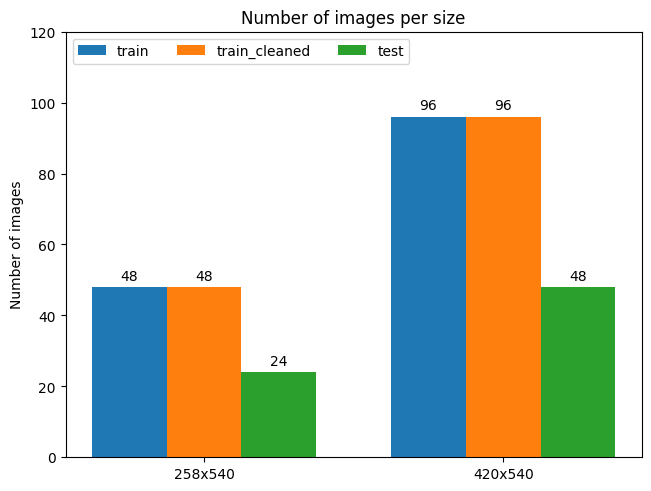

In [15]:
y = [[train_sizes_set[1][0],train_sizes_set[1][1]],
    [train_cleaned_sizes_set[1][0],train_cleaned_sizes_set[1][1]],
    [test_sizes_set[1][0],test_sizes_set[1][1]]    ]

x_label = ('258x540','420x540')

legend = ['train', 'train_cleaned', 'test']

x = np.arange(len(x_label))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for i, measurement in enumerate(y):
    offset = width * multiplier
    rects = ax.bar(x + offset, measurement, width, label=legend[i])
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Number of images')
ax.set_title('Number of images per size')
ax.set_xticks(x + width, x_label)
ax.legend(loc='upper left', ncols=3)
ax.set_ylim(0, 120)

plt.show()

From the above plot one can find that there are two image sizes (285x540 and 420x540) and in train, train_cleaned and test folder there are 2 times more big pictures (420x540) than small pictures (258x540)

Image pre-processing
-----------

In the next steps we perform the follwing steps to clean and pre-process the images:
- reshape all images to have the same size (420x540)
- transform to gray scale
- normalize the grayscale


a helper function to resize images

In [16]:
def resize(image, size1,size2):
    return  cv2.resize(image, (size1, size2))

a helper function to transform all images to gray scale

In [17]:
def gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

A helper function to normalize the grayscale

In [18]:
def normalize(image):
    return image/255.0

and finally a pre-processing function (using functions above) to read and process the images

In [19]:
def pre_process(file):
    image = cv2.imread(file)
    image = np.asarray(image, dtype="float32")
    # using 3 functions above
    image = normalize(gray_scale(resize(image, 540,420)))
    image = np.reshape(image, (420, 540, 1))
    return image

Pre-processing all images in each folder and add them to their corresponding list

In [20]:
train_proc = []
train_cleaned_proc = []
test_proc = []

for image in train:
    train_proc.append(pre_process(image))

for image in train_cleaned:
    train_cleaned_proc.append(pre_process(image))
   
for image in test:
    test_proc.append(pre_process(image))

Plotting the same images as above this time after pre-processing

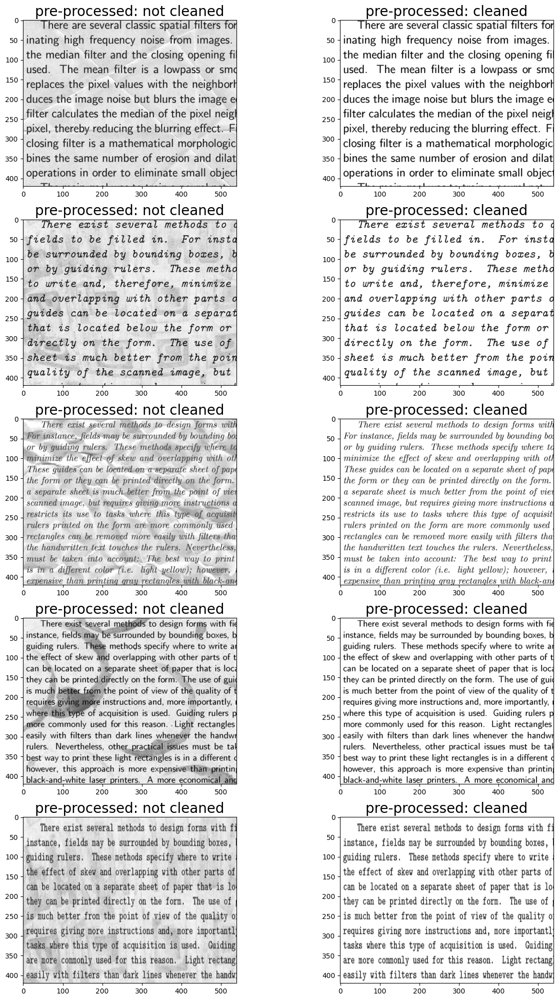

In [21]:
fig1, ax1 = plt.subplots(5, 2, figsize=(15, 25))

for i,j in enumerate([10, 20, 40, 60, 120]):
    ax1[i, 0].imshow(train_proc[j][:,:,0], cmap='gray')
    ax1[i,0].set_title('pre-processed: not cleaned', fontsize=20)
  
    ax1[i, 1].imshow(train_cleaned_proc[j][:,:,0], cmap='gray')
    ax1[i,1].set_title('pre-processed: cleaned', fontsize=20)

plt.show()

checking all image  sizes:

In [22]:
def image_sizes_proc(images):
    sizes = []
    for image in images:
        sizes.append(image.shape)
    return sizes


train_sizes_proc = np.array(image_sizes_proc(train_proc))
train_cleaned_sizes_proc = np.array(image_sizes_proc(train_cleaned_proc))
test_sizes_proc = np.array(image_sizes_proc(test_proc))

train_sizes_set_proc = np.unique(train_sizes_proc,return_counts=True, axis=0)
train_cleaned_sizes_set_proc = np.unique(train_cleaned_sizes_proc,return_counts=True, axis=0)
test_sizes_set_proc = np.unique(test_sizes_proc,return_counts=True, axis=0)
print(train_sizes_set_proc)
print(train_cleaned_sizes_set_proc)
print(test_sizes_set_proc)

(array([[420, 540,   1]]), array([144]))
(array([[420, 540,   1]]), array([144]))
(array([[420, 540,   1]]), array([72]))


we see that all image sizes are the same now

___________
Basic Autoencoder model
----------


Splitting the training datset to 80% for training and 20% validation

In [23]:
X_train = np.asarray(train_proc)
Y_train = np.asarray(train_cleaned_proc)
X_test = np.asarray(test_proc)

X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.2)

Building the autoencoder model as following: 
- input layer (420x540)
- Conv2D: 32, relu
- Conv2D: 64, relu
- Conv2D: 128, relu
- Maxpooling (2,2)
- Conv2Dtranspose: 64, relu with stride (2,2)
- Conv2Dtranspose: 32, relu
- Conv2Dtranspose: 1, sigmoid for output

In [48]:
def build_model():
    model = Sequential()

    # Encoder part
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(420, 540, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), padding='same'))

    # Decoder part
    model.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu', padding='same'))
    model.add(Conv2DTranspose(32, (3, 3), activation='relu', padding='same'))
    model.add(Conv2DTranspose(1, (3, 3), activation='sigmoid', padding='same'))

    # compiling with adam and 
    model.compile(optimizer='adam' , loss='mean_squared_error', metrics=['mse','accuracy'])

    return model

In [49]:
model = build_model()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


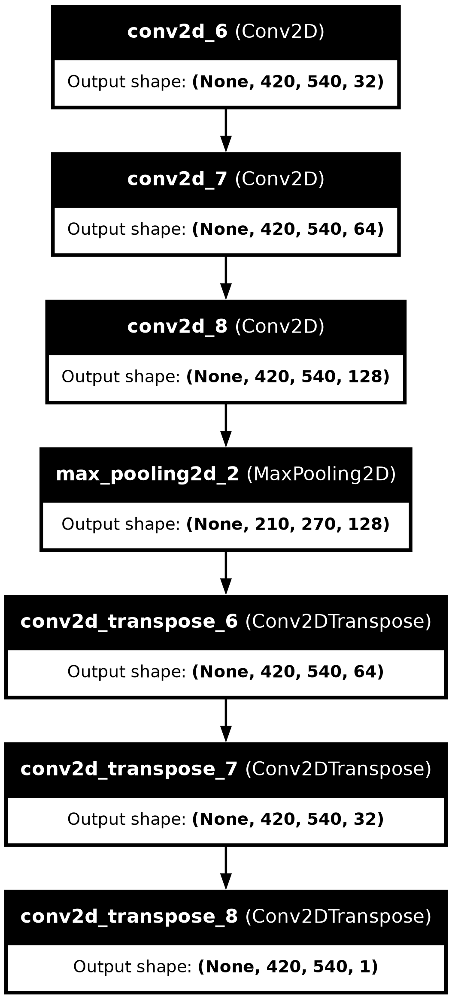

In [50]:
# Display the model architecture
tf.keras.utils.plot_model(model, to_file='autoencoder.png', show_shapes=True, show_layer_names=True)
Image('autoencoder.png', width=500, height=400)

In [51]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 420, 540, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 420, 540, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 420, 540, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 210, 270, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_6              │ (None, 420, 540, 64)   │        73,792 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_7              │ (None, 420, 540, 32)   │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_8              │ (None, 420, 540, 1)    │           289 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 185,217 (723.50 KB)

 Trainable params: 185,217 (723.50 KB)

 Non-trainable params: 0 (0.00 B)

I use early stopping to stop the epochs once the model starts overfitting

In [52]:
es = EarlyStopping(patience=5, restore_best_weights=True)

fitting the model:

In [53]:
history = model.fit(X_train, Y_train, validation_data = (X_val, Y_val), epochs=100, batch_size=16, verbose=1, callbacks=[es])

Epoch 1/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 763ms/step - accuracy: 0.4464 - loss: 0.1720 - mse: 0.1734 - val_accuracy: 0.6446 - val_loss: 0.0766 - val_mse: 0.0763
Epoch 2/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 392ms/step - accuracy: 0.6548 - loss: 0.0758 - mse: 0.0758 - val_accuracy: 0.6446 - val_loss: 0.0745 - val_mse: 0.0742
Epoch 3/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 393ms/step - accuracy: 0.6462 - loss: 0.0640 - mse: 0.0641 - val_accuracy: 0.6446 - val_loss: 0.0562 - val_mse: 0.0560
Epoch 4/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 392ms/step - accuracy: 0.6470 - loss: 0.0506 - mse: 0.0506 - val_accuracy: 0.6446 - val_loss: 0.0399 - val_mse: 0.0398
Epoch 5/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 392ms/step - accuracy: 0.6465 - loss: 0.0362 - mse: 0.0363 - val_accuracy: 0.6538 - val_loss: 0.0293 - val_mse: 0.0293
Epoch 6/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 392ms/step - accuracy: 0.6549 - loss: 0.0256 - mse: 0.0257 - val_accuracy: 0.6614 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 7/100
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 393ms/

In [58]:
def plot_mse_accuracy(history, title):
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    ax[0].plot(history.history['mse'], label='train MSE',linewidth=4)
    ax[0].plot(history.history['val_mse'], label='val MSE',linewidth=4)
    ax[0].legend(loc='best', fontsize=20)
    ax[0].set_title(title, fontsize=20)
    ax[0].set_xlabel('Epochs', fontsize=20)
    ax[0].set_ylabel('MSE', fontsize=20)

    ax[1].plot(history.history['accuracy'], label='train Accuracy',linewidth=4)
    ax[1].plot(history.history['val_accuracy'], label='val Accuracy',linewidth=4)
    ax[1].legend(loc='best', fontsize=20)
    ax[1].set_title(title, fontsize=20)
    ax[1].set_xlabel('Epochs', fontsize=20)
    ax[1].set_ylabel('Accuracy', fontsize=20)
    
    plt.show()


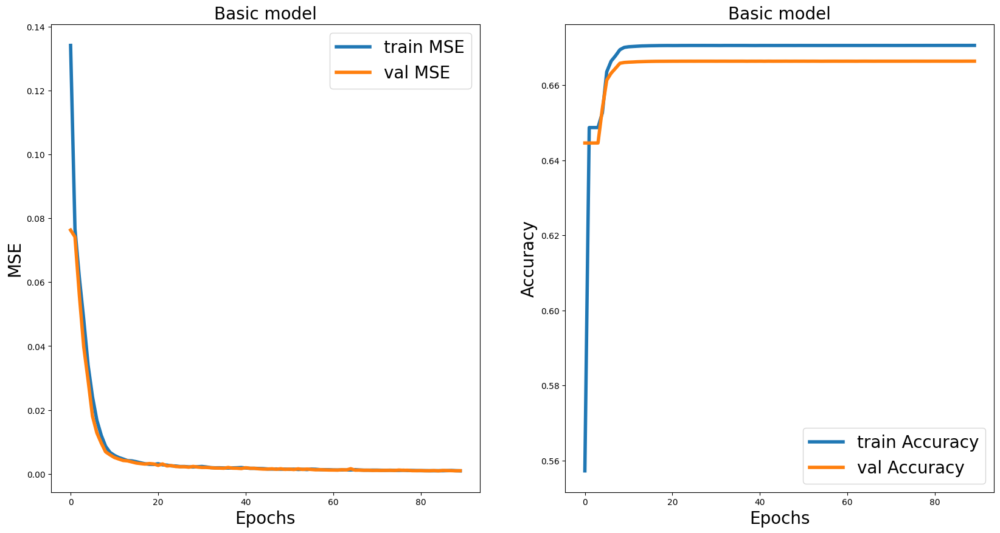

In [59]:
plot_mse_accuracy(history, 'Basic model')

Prediction using the basic model:

In [99]:
Y_test = model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step


a helper function to plot the prediction images compared to uncleaned images:

In [61]:
def plot_pred(X_test,Y_test):
    fig2, ax2 = plt.subplots(5, 2, figsize=(15, 25))

    for i,j in enumerate([10, 20, 30, 50, 70]):
        ax2[i, 0].imshow(X_test[j][:,:,0], cmap='gray')
        ax2[i,0].set_title('prediction: not cleaned', fontsize=20)
  
        ax2[i, 1].imshow(Y_test[j][:,:,0], cmap='gray')
        ax2[i,1].set_title('prediction: cleaned', fontsize=20)

    plt.show()

plotting the prediction

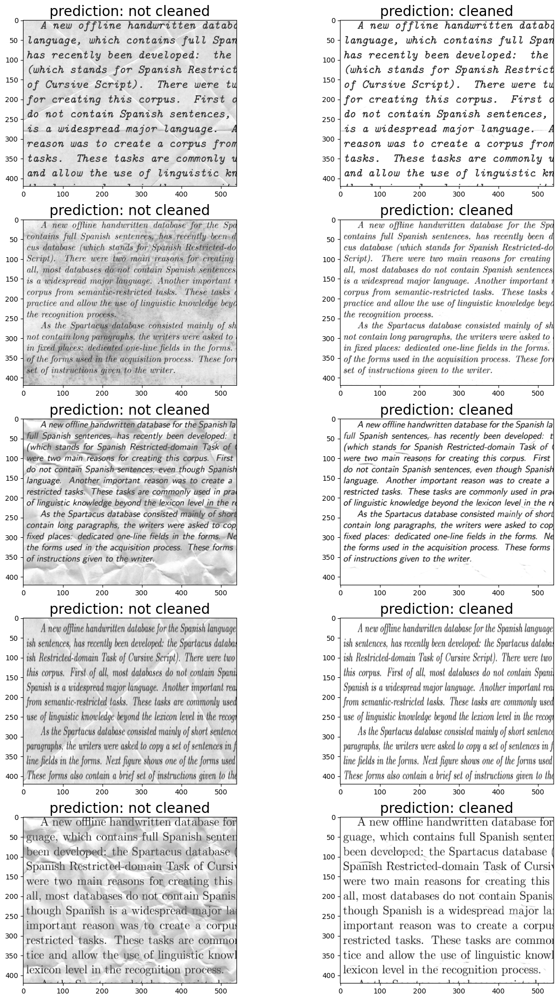

In [62]:
plot_pred(X_test,Y_test)

The results looks very nice, with most of the background noise removed form the images

------------
Hyperparameter optimization nad model modification
---------------

to furhter improve the model and decrease the mse I choose the following hyperparameters to be optimized:
- batch size: 4,8,16 (unfortunately due the limitation in computational resources I couldn't try bigger batch sizes)
- droput rate: 0.0, 0.2 I add a dropout layer after the encoder part to potentially reduce the overfitting
- learning rate: 0.0001, 0.001, 0.01

I define a new function for the model for the hyperparameter tuning that includes adroput layer (after the encoder part) and can 

In [85]:
def build_model_hyp_opt(dropout_rate=0.0, learning_rate=0.001):
    model = Sequential()

    # Encoder part
    model.add(Conv2D(32, (3, 3), activation='relu', padding='same', input_shape=(420, 540, 1)))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), padding='same'))
    model.add(Dropout(dropout_rate))

    # Decoder part
    model.add(Conv2DTranspose(64, (3, 3), strides=(2, 2), activation='relu', padding='same'))
    model.add(Conv2DTranspose(32, (3, 3), activation='relu', padding='same'))
    model.add(Conv2DTranspose(1, (3, 3), activation='sigmoid', padding='same'))

    optimizer = Adam(learning_rate=learning_rate)
    model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mse', 'accuracy'])

    return model

Parameters for hte grid search:

In [86]:
param_grid = {
    'batch_size':[4, 8, 16],
    'learning_rate':[0.0001,0.001,0.01],
    'dropout_rate': [0.0,0.2]
}

Grid search
----------

grid search is sperformed by looping around all combinations of hyperparameters and selecting the best model, i.e. the model with the lowest MSE (in the competition the evaluation is done based on the MSE)

In [87]:
# initialization of values to find the best model
best_val_mse = 1000
best_params = {}
best_model = model
best_history = history

# gridserach: looping over all hyperparameters
for batch_size in param_grid['batch_size']:
    for learning_rate in param_grid['learning_rate']:
        for dropout_rate in param_grid['dropout_rate']:
            # eraly stoppping
            es = EarlyStopping(patience=5, restore_best_weights=True)
            model_hyp_opt = build_model_hyp_opt(learning_rate=learning_rate, dropout_rate=dropout_rate)
            history_hyp_opt = model_hyp_opt.fit(X_train, Y_train, validation_data = (X_val, Y_val), epochs=100, batch_size=batch_size, verbose=0, callbacks=[es])
            val_mse = np.min(history_hyp_opt.history['val_mse'])
            print('batch size: %f, learning rate: %f, dropout rate: %f --> val_mse: %f' 
                  % (batch_size, learning_rate,dropout_rate,val_mse))
            if val_mse < best_val_mse:
                best_val_mse = val_mse
                best_params ={
                      'batch_size':batch_size,
                      'learning_rate':learning_rate,
                      'dropout_rate': dropout_rate
                }
                best_model = model_hyp_opt
                best_history = history_hyp_opt
            
print('best value mse: %f using %s' % (best_val_mse, best_params))

batch size: 4.000000, learning rate: 0.000100, dropout rate: 0.000000 --> val_mse: 0.001366
batch size: 4.000000, learning rate: 0.000100, dropout rate: 0.200000 --> val_mse: 0.001315
batch size: 4.000000, learning rate: 0.001000, dropout rate: 0.000000 --> val_mse: 0.000514
batch size: 4.000000, learning rate: 0.001000, dropout rate: 0.200000 --> val_mse: 0.000555
batch size: 4.000000, learning rate: 0.010000, dropout rate: 0.000000 --> val_mse: 0.082753
batch size: 4.000000, learning rate: 0.010000, dropout rate: 0.200000 --> val_mse: 0.082753
batch size: 8.000000, learning rate: 0.000100, dropout rate: 0.000000 --> val_mse: 0.001842
batch size: 8.000000, learning rate: 0.000100, dropout rate: 0.200000 --> val_mse: 0.001854
batch size: 8.000000, learning rate: 0.001000, dropout rate: 0.000000 --> val_mse: 0.000823
batch size: 8.000000, learning rate: 0.001000, dropout rate: 0.200000 --> val_mse: 0.000759
batch size: 8.000000, learning rate: 0.010000, dropout rate: 0.000000 --> val_ms

Outcome of hyperparameter tuning: the best model is with: 'batch_size': 4, 'learning_rate': 0.001, 'dropout_rate': 0.0

Plot the MSE and accuracy of the best model

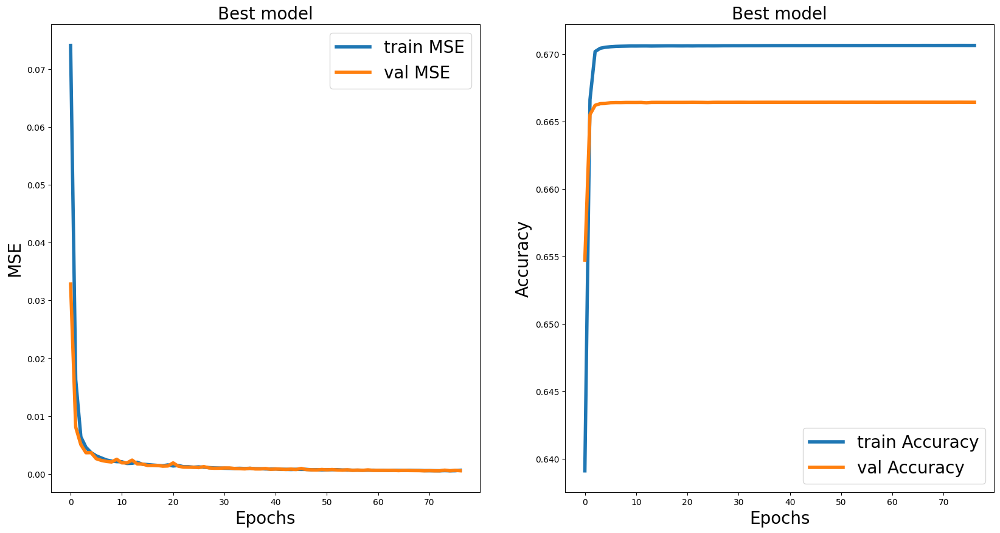

In [88]:
plot_mse_accuracy(best_history, 'Best model')

Predciting the test images with the best model

In [89]:
Y_test_best = best_model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 299ms/step


Plotting the prediction using the best model

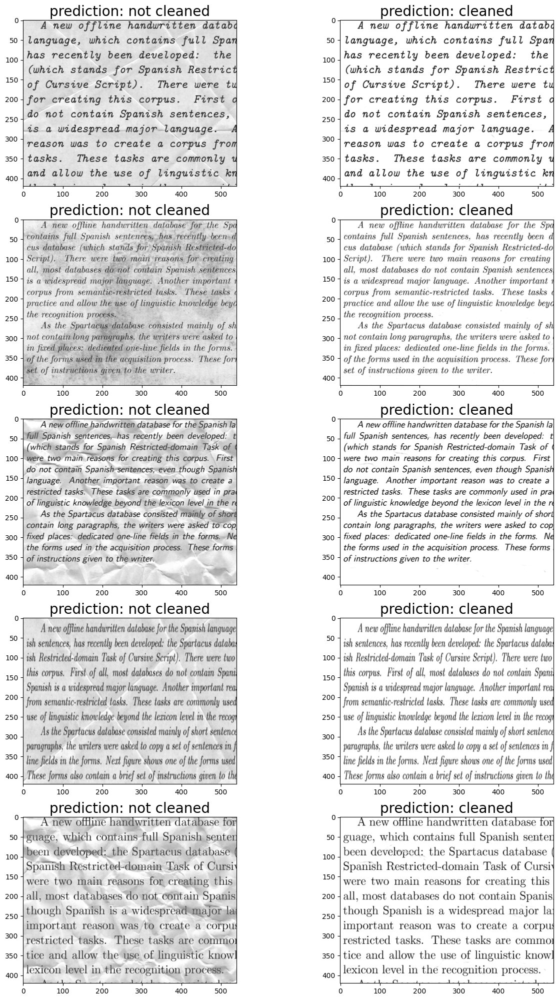

In [90]:
plot_pred(X_test,Y_test_best)

----------------
Predicting the test images and Submission
-----------

below I prepare the submission file according to the template submission file for Kaggle competition

In [94]:
ids = []
vals = []
for i, f in enumerate(test):
    print(f)
    file = '/kaggle/working/' + f
    imigid = f.replace('test/','')
    imigid = imigid.replace('.png','')
    imgid = int(imigid)
    img = cv2.imread(file, 0)
    img_shape = img.shape
    preds_reshaped = cv2.resize(Y_test[i], (img_shape[1], img_shape[0]))

    for r in range(img_shape[0]):
        for c in range(img_shape[1]):
            ids.append(str(imgid)+'_'+str(r + 1)+'_'+str(c + 1))
            vals.append(preds_reshaped[r, c])

submission = pd.DataFrame({'id': ids, 'value': vals})
submission.to_csv('submission.csv',index = False)

test/1.png
test/10.png
test/100.png
test/103.png
test/106.png
test/109.png
test/112.png
test/115.png
test/118.png
test/121.png
test/124.png
test/127.png
test/13.png
test/130.png
test/133.png
test/136.png
test/139.png
test/142.png
test/145.png
test/148.png
test/151.png
test/154.png
test/157.png
test/16.png
test/160.png
test/163.png
test/166.png
test/169.png
test/172.png
test/175.png
test/178.png
test/181.png
test/184.png
test/187.png
test/19.png
test/190.png
test/193.png
test/196.png
test/199.png
test/202.png
test/205.png
test/208.png
test/211.png
test/214.png
test/22.png
test/25.png
test/28.png
test/31.png
test/34.png
test/37.png
test/4.png
test/40.png
test/43.png
test/46.png
test/49.png
test/52.png
test/55.png
test/58.png
test/61.png
test/64.png
test/67.png
test/7.png
test/70.png
test/73.png
test/76.png
test/79.png
test/82.png
test/85.png
test/88.png
test/91.png
test/94.png
test/97.png


-------------
Conclusion
-------------

n this project, I developed and fine-tuned an Autoencoder aimed at removing the background noise (denoising) documents to enhance their suitability for Optical Character Recognition (OCR) tasks. Overall, the results were promising, with a substantial reduction in background noise across the documents.

Hyperparameter tuning yielded insightful findings (see table below). Interestingly, the dropout rate exhibited minimal influence on the model's performance, while a learning rate of 0.001 consistently delivered the best results among the tested values. Moreover, a smaller batch size, specifically 4, outperformed larger batch sizes. The best model wasa with batch size=4, learning rate=0.001 and no dropout.

|batch size|learning rate|dropout rate|min. MSE(validation)|
| --- | ---   |--- | --- |
| 4| 0.0001  |0.0 |0.001366|
| 4| 0.0001  |0.2 |0.001315|
| 4| 0.001  |0.0 | 0.000514|
| 4| 0.001  |0.2 | 0.000555|
| 4| 0.01  |0.0 | 0.082753|
| 4| 0.01  |0.2 |0.082753 |
| 8| 0.0001  |0.0 |0.001842|
| 8| 0.0001  |0.2 |0.001854|
| 8| 0.001  |0.0 | 0.000823|
| 8| 0.001  |0.2 | 0.000759|
| 8| 0.01  |0.0 | 0.082753|
| 8| 0.01  |0.2 | 0.082753|
| 16| 0.0001  |0.0 |0.002907|
| 16| 0.0001  |0.2 |0.002860|
| 16| 0.001  |0.0 | 0.001855|
| 16| 0.001  |0.2 | 0.000908|
| 16| 0.01  |0.0 | 0.082753|
| 16| 0.01  |0.2 | 0.082753|

Below is the reuslt of submission to the kaggle competition:

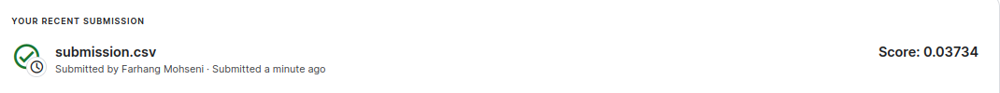

However, due to computational limitations, I was unable to conduct hyperparameter tuning on other critical parameters such as the autoencoder's architecture or the choice of optimizer. Exploring these aspects could be an interesting follo-up study.